In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import random
from PIL import Image
from matplotlib import pyplot as plt
import xml.etree.ElementTree as ET
import torch
import torchvision
import os
#from google.colab import drive
#drive.mount('/content/drive')

# Any results you write to the current directory are saved as output.

In [2]:
os.chdir('/Users/USER/OneDrive/桌面/PELVIS_DATASET') #切換該目錄
os.listdir() #確認目錄內容

['model_7_29.pth',
 'model_7_31.pth',
 'model_7_31_88acc.pth',
 'train_image',
 'train_label',
 'val_image',
 'val_label']

In [3]:
from PIL import Image
import numpy as np
import os

def data_statistic(image_dir, xml_dir):
    images = []
    labels = []

    for img_file in os.listdir(image_dir):
        if img_file.endswith('.png'):
            img_path = os.path.join(image_dir, img_file)
            label_file = img_file.replace('.png', '.xml')
            label_path = os.path.join(xml_dir, label_file)

            image = Image.open(img_path)
            image = image.resize((256, 256))
            images.append(np.array(image))

            labels.append(label_path)

    return images, labels

# 载入数据集
image_dir = '/Users/USER/OneDrive/桌面/PELVIS_DATASET/train_image'
xml_dir = '/Users/USER/OneDrive/桌面/PELVIS_DATASET/train_label'

images, labels = data_statistic(image_dir, xml_dir)


In [4]:
images = os.listdir(image_dir)
print("Number of Images: ", len(images))

Number of Images:  312


In [5]:
images_to_display = random.choices(images, k=6)

fig = plt.figure(figsize=(225, 225))
for ii, img in enumerate(images_to_display):
    ax = fig.add_subplot(3, 3, ii + 1, xticks=[], yticks=[])

    img = Image.open(os.path.join(image_dir, img))
    plt.imshow(img)

In [6]:
from torch.utils.data import Dataset
from PIL import Image
import xml.etree.ElementTree as ET
from torchvision.transforms import ToTensor
import os
import torch

class CustomDataset(Dataset):
    def __init__(self, image_dir, xml_dir, transform=None):
        self.image_dir = image_dir
        self.xml_dir = xml_dir
        self.transform = transform
        self.loaded_images = []
        self.loaded_bboxes = []
        self.loaded_labels = []
        self.load_data()

    def __len__(self):
        return len(self.loaded_images)

    def __getitem__(self, idx):
        img = self.loaded_images[idx]
        bbox = self.loaded_bboxes[idx]
        label = self.loaded_labels[idx]

        if self.transform:
            img = self.transform(img)

        return img, torch.tensor(label)

    def load_data(self):
        for img_file in os.listdir(self.image_dir):
            if img_file.endswith('.png'):
                img_path = os.path.join(self.image_dir, img_file)
                label_file = img_file.replace('.png', '.xml')
                label_path = os.path.join(self.xml_dir, label_file)

                loaded_images, loaded_bboxes, loaded_labels = self.ImageLoader(img_path, label_path)
                self.loaded_images.extend(loaded_images)
                self.loaded_bboxes.extend(loaded_bboxes)
                self.loaded_labels.extend(loaded_labels)

    def ImageLoader(self, img_path, label_path):
        bbox_list = []

        label_list = []
        loaded_images = []
        loaded_bboxes = []
        loaded_labels = []

        tree = ET.parse(label_path)
        root = tree.getroot()

        objects = root.findall('object')
        for obj in objects:
            label = obj.find('name').text
            bmd, diagnosis = label.strip('()').split(',')
            bmd_value = float(bmd.strip())
            diagnosis = diagnosis.strip()
            # Map the diagnosis to class index
            if diagnosis == 'osteoporosis':
                label_idx = 1
            elif diagnosis == 'osteopenia':
                label_idx = 0

            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            bbox = (xmin, ymin, xmax, ymax)
            bbox_list.append(bbox)
            label_list.append(label)


        img = Image.open(img_path)
        for bbox, label in zip(bbox_list, label_list):
            cropped_img = img #img.crop(bbox)
            cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)
            # 将图像转换为RGB模式
            cropped_img = cropped_img.convert('RGB')
            loaded_images.append(cropped_img)
            loaded_bboxes.append(bbox)
            loaded_labels.append(label_idx)

        return loaded_images, loaded_bboxes, loaded_labels



# 创建数据集和转换
train_dataset = CustomDataset(
    image_dir='/Users/USER/OneDrive/桌面/PELVIS_DATASET/train_image',
    xml_dir='/Users/USER/OneDrive/桌面/PELVIS_DATASET/train_label',
    transform=ToTensor()
)

dataset_length = len(train_dataset)
print(dataset_length)

C:\Users\User\AppData\Local\Temp\ipykernel_9992\4258290535.py:79: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)


312


In [7]:
# 创建数据集和转换
val_dataset = CustomDataset(
    image_dir='/Users/USER/OneDrive/桌面/PELVIS_DATASET/val_image',
    xml_dir='/Users/USER/OneDrive/桌面/PELVIS_DATASET/val_label',
    transform=ToTensor()
)

C:\Users\User\AppData\Local\Temp\ipykernel_9992\4258290535.py:79: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)


In [8]:
dataset_length = len(val_dataset)
print(dataset_length)

84


In [9]:
from torchvision import transforms

# 定义随机旋转角度范围（以度为单位）
rotation_range = (-20, 20)
brightness_range = (0.95, 1.05)  # 亮度范围为原始亮度的95%到105%

# 定義每個轉換的機率為15%
rotation_prob = 0.2
brightness_prob = 0.3

# 创建数据增强的变换
data_rotation = transforms.Compose([
    transforms.RandomRotation(rotation_range),
    #transforms.RandomApply([transforms.RandomRotation(rotation_range)], p=rotation_prob),
    transforms.RandomApply([transforms.ColorJitter(brightness=brightness_range)], p=brightness_prob),
    transforms.Resize((256, 256)),
    ToTensor()
])

# 对数据集应用数据增强变换
rotation_dataset = CustomDataset(
    image_dir='/Users/USER/OneDrive/桌面/PELVIS_DATASET/train_image',
    xml_dir='/Users/USER/OneDrive/桌面/PELVIS_DATASET/train_label',
    transform=data_rotation
)

C:\Users\User\AppData\Local\Temp\ipykernel_9992\4258290535.py:79: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)


In [10]:
dataset_length = len(rotation_dataset)
print(dataset_length)

312


In [11]:
from torchvision import transforms


# 創建數據增強的變換
data_flip = transforms.Compose([
    transforms.functional.hflip,
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# 对数据集应用数据增强变换
right_hip_dataset = CustomDataset(
    image_dir='/Users/USER/OneDrive/桌面/right_hip/image',
    xml_dir='/Users/USER/OneDrive/桌面/right_hip/label',
    transform=data_flip 
)

C:\Users\User\AppData\Local\Temp\ipykernel_9992\4258290535.py:79: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)


In [12]:
dataset_length = len(right_hip_dataset)
print(dataset_length)

297


In [13]:
from torchvision import transforms

# 定义随机旋转角度范围（以度为单位）
rotation_range = (-20, 20)
brightness_range = (0.95, 1.05)  # 亮度范围为原始亮度的95%到105%

# 定義每個轉換的機率為15%
rotation_prob = 0.2
brightness_prob = 0.3
# 創建數據增強的變換
data_flip = transforms.Compose([
    transforms.functional.hflip,
    transforms.RandomRotation(rotation_range),
    #transforms.RandomApply([transforms.RandomRotation(rotation_range)], p=rotation_prob),
    transforms.RandomApply([transforms.ColorJitter(brightness=brightness_range)], p=brightness_prob),
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# 对数据集应用数据增强变换
right_hip_transform = CustomDataset(
    image_dir='/Users/USER/OneDrive/桌面/right_hip/image',
    xml_dir='/Users/USER/OneDrive/桌面/right_hip/label',
    transform=data_flip 
)

C:\Users\User\AppData\Local\Temp\ipykernel_9992\4258290535.py:79: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  cropped_img = cropped_img.resize((256, 256), Image.ANTIALIAS)


In [14]:
dataset_length = len(right_hip_transform)
print(dataset_length)

297


In [15]:
from torch.utils.data import DataLoader
from torch.utils.data import ConcatDataset

combined_dataset = ConcatDataset([train_dataset,rotation_dataset,right_hip_dataset,right_hip_transform])

In [16]:
dataset_length = len(combined_dataset)
print(dataset_length)

1218


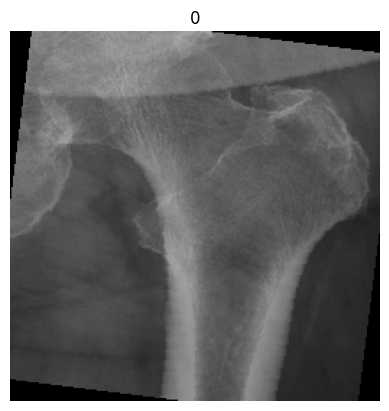

In [17]:
import matplotlib.pyplot as plt

data_point =combined_dataset[599]
tensor, _ = data_point
label_tensor = torch.tensor(0)  # 將標籤值設置為 tensor(0)

label = str(label_tensor.item())  # 將標籤 tensor 轉換為字串

image = tensor.permute(1, 2, 0)  # 將通道維度移到最後

plt.imshow(image)
plt.title(label)  # 設置標題為標籤值的字串形式
plt.axis('off')
plt.show()


In [18]:
import matplotlib.pyplot as plt

_, axes = plt.subplots(figsize=(256, 256), ncols=3, nrows=3)

for i, ax in enumerate(axes.flatten()):
    tensor, label = rotation_dataset[i]
    image = tensor.permute(1, 2, 0)  # 將通道維度移到最後
    ax.imshow(image)
    ax.set_title(label)  # 設置標題為標籤值
    ax.axis('off')

plt.show()




In [19]:
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision
from torchvision import transforms
from collections import OrderedDict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torch
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torch.nn.functional as F




In [20]:
num_of_osteoporosis = 0
num_of_osteopenia = 0

for _,  label in combined_dataset:
    if label.item() == 1:  # 將 Tensor 轉換為整數值進行比較
        num_of_osteoporosis += 1
    elif label.item() == 0:
        num_of_osteopenia += 1

print(f"Total number of samples in osteoporosis class: {num_of_osteoporosis}")
print(f"Total number of samples in osteopenia class: {num_of_osteopenia}")

Total number of samples in osteoporosis class: 530
Total number of samples in osteopenia class: 688


In [21]:
import random

# 計算兩個類別的數量
count_osteoporosis = num_of_osteoporosis
count_osteopenia = num_of_osteopenia

# 決定從 "osteopenia" 類別中隨機選取多少樣本
num_samples_to_keep = count_osteoporosis

# 進行隨機欠採樣，將 "osteopenia" 類別的樣本數量減少到與 "osteoporosis" 相同
under_sampling_dataset = []
num_samples_kept = 0

for sample, label in combined_dataset:
    if label.item() == 0:  # "osteopenia" 類別
        if num_samples_kept < num_samples_to_keep:
            under_sampling_dataset.append((sample,label))
            num_samples_kept += 1
        else:
            # 跳過額外的 "osteopenia" 樣本
            continue
    else:  # "osteoporosis" 類別
        under_sampling_dataset.append((sample, label))

In [22]:
count_osteoporosis = 0
count_osteopenia = 0

for _,  label in under_sampling_dataset:
    if label.item() == 1:  # 將 Tensor 轉換為整數值進行比較
        count_osteoporosis += 1
    elif label.item() == 0:
        count_osteopenia += 1
print(f"Total number of samples in osteoporosis class: {count_osteoporosis}")
print(f"Total number of samples in osteopenia class: {count_osteopenia}")

Total number of samples in osteoporosis class: 530
Total number of samples in osteopenia class: 530


In [23]:
#from sklearn.model_selection import KFold

#batch_size = 5
#k = 5  # 折叠数
#kfold = KFold(n_splits=k, shuffle=True)

#for fold, (train_indices, val_indices) in enumerate(kfold.split(combined_dataset)):
    #print(f"Fold {fold+1}/{k}")
    #print("-" * 10)

    # 根据索引创建训练集和验证集的子集
    #train_subset = torch.utils.data.Subset(combined_dataset, train_indices)
    #val_subset = torch.utils.data.Subset(combined_dataset, val_indices)

    # 创建训练集和验证集的数据加载器
    #train_loader = torch.utils.data.DataLoader(train_subset, batch_size=batch_size, shuffle=True)
    #test_loader = torch.utils.data.DataLoader(val_subset, batch_size=batch_size, shuffle=False)


In [24]:
from torch.utils.data import random_split

# 定義combined_dataset，這個是您之前創建的數據集

# 定義切分比例，例如切分成70%的訓練集和30%的測試集
train_ratio = 0.8
train_size = int(train_ratio * len(combined_dataset))
test_size = len(combined_dataset) - train_size

# 切分數據集
train_dataset, test_dataset = random_split(combined_dataset, [train_size, test_size])

# 定義batch_size
batch_size = 5

# 創建data loader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [25]:
print(len(train_loader))  # 打印train_loader中的批次数量
print(len(test_loader))  # 打印test_loader中的批次数量

195
49


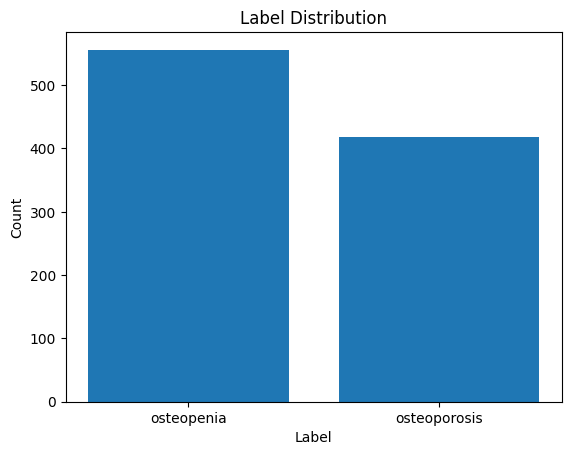

In [26]:
import matplotlib.pyplot as plt

# 統計每個類別的樣本數量
label_counts = {}

for _, labels in train_loader:
    for label in labels:
        label = label.item()
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1

# 提取類別標籤和對應的樣本數量
labels = list(label_counts.keys())
counts = list(label_counts.values())

# 定義類別標籤的名稱
label_names = ['osteopenia', 'osteoporosis']  # 假設兩個類別分別為"osteopenia"和"osteoporosis"

# 設置x軸的標籤為類別名稱
plt.xticks(labels, label_names)

# 繪製柱狀圖
plt.bar(labels, counts)
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Label Distribution')
plt.show()


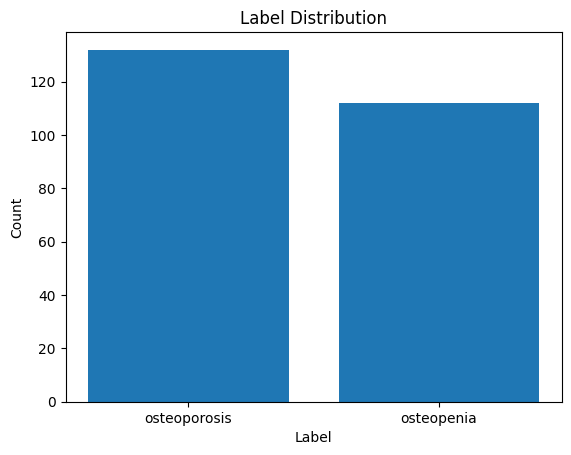

In [27]:
import matplotlib.pyplot as plt

# 統計每個類別的樣本數量
label_counts = {}

for _, labels in test_loader:
    for label in labels:
        label = label.item()
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1

# 提取類別標籤和對應的樣本數量
labels = list(label_counts.keys())
counts = list(label_counts.values())

# 定義類別標籤的名稱
label_names = ['osteopenia', 'osteoporosis']  # 假設兩個類別分別為"osteopenia"和"osteoporosis"

# 設置x軸的標籤為類別名稱
plt.xticks(labels, label_names)

# 繪製柱狀圖
plt.bar(labels, counts)
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Label Distribution')
plt.show()

In [28]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("GPU可用")
else:
    device = torch.device("cpu")
    print("GPU不可用")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


GPU可用


In [29]:
import torch.nn.functional as F
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau

# 載入預訓練模型
model = models.resnet34(pretrained=True)

model = model.to(device)
# 将模型的最后一层替换为适合你的任务的新的全连接层
num_classes = 1  # 因為使用 BCEWithLogitsLoss，只需一個輸出節點
model.fc = nn.Linear(model.fc.in_features, num_classes)

# 2. 定义损失函数
criterion = nn.BCEWithLogitsLoss()

# 3. 定义优化器
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9 ,weight_decay=0.03)
# optim.SGD(model.parameters(), lr=0.001, momentum=0.9 ,weight_decay=0.03)
# optim.Adam(model.parameters(), lr=0.001)

# 4. 设置学习率调度器（可选）
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.1) 
#  optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.1) 
#  optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

C:\Users\User\anaconda3\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\User\anaconda3\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [30]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Epoch 1/50
----------
Train Loss: 0.6758 Acc: 0.6273
Val Loss: 0.6998 Acc: 0.6475
Epoch 2/50
----------
Train Loss: 0.5330 Acc: 0.7331
Val Loss: 0.4896 Acc: 0.7541
Epoch 3/50
----------
Train Loss: 0.4292 Acc: 0.8111
Val Loss: 0.4082 Acc: 0.8074
Epoch 4/50
----------
Train Loss: 0.3571 Acc: 0.8470
Val Loss: 0.4132 Acc: 0.8238
Epoch 5/50
----------
Train Loss: 0.3164 Acc: 0.8758
Val Loss: 0.3329 Acc: 0.8525
Epoch 6/50
----------
Train Loss: 0.3024 Acc: 0.8634
Val Loss: 0.3582 Acc: 0.8770
Epoch 7/50
----------
Train Loss: 0.2825 Acc: 0.8984
Val Loss: 0.4503 Acc: 0.7746
Epoch 8/50
----------
Train Loss: 0.2280 Acc: 0.9230
Val Loss: 0.1974 Acc: 0.9098
Epoch 9/50
----------
Train Loss: 0.2692 Acc: 0.8973
Val Loss: 0.2301 Acc: 0.9180
Epoch 10/50
----------
Train Loss: 0.2627 Acc: 0.9025
Val Loss: 0.4939 Acc: 0.7377
Epoch 11/50
----------
Train Loss: 0.2736 Acc: 0.9014
Val Loss: 0.2149 Acc: 0.9180
Epoch 12/50
----------
Train Loss: 0.2041 Acc: 0.9240
Val Loss: 0.3605 Acc: 0.8320
Epoch 13/50
-

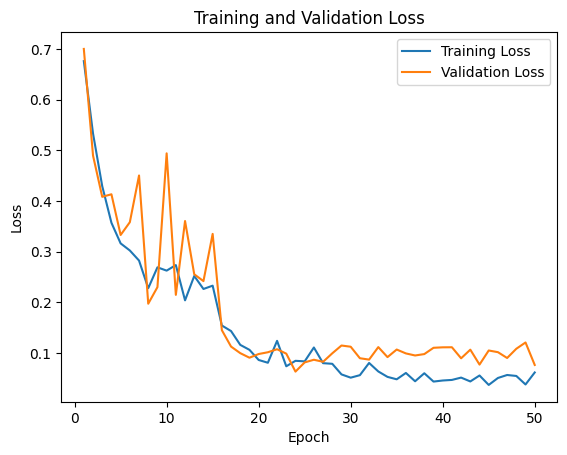

In [31]:
import matplotlib.pyplot as plt
import time
# 记录开始时间
start_time = time.time()

def train_model(model, criterion, optimizer,scheduler,num_epochs):
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print("-" * 10)

        # 訓練階段
        model.train()
        train_loss = 0.0
        train_corrects = 0

        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = (labels.unsqueeze(1)).to(device) 
            model = model.to(device)
            optimizer.zero_grad()

            # 前向傳播
            outputs = model(inputs)
            
            #用來算ACC
            pred = torch.sigmoid(outputs).round().long()
            
            loss = criterion(outputs, labels.float())
            # 反向傳播和參數更新
            loss.backward()
            optimizer.step()
        
        
            train_loss += loss.item() * inputs.size(0)
            train_corrects += torch.sum(torch.eq(pred, labels))

            
        train_loss = train_loss / len(train_loader.dataset)
        train_acc = train_corrects / len(train_loader.dataset)

        print(f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f}")
        train_losses.append(train_loss)

        # 驗證階段
        model.eval()
        val_loss = 0.0
        val_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs = inputs.to(device)
                labels = (labels.unsqueeze(1)).to(device) 
                
                # 前向傳播
                outputs = model(inputs)
                
                #用來算ACC
                pred = torch.sigmoid(outputs).round().long()
                
                loss = criterion(outputs, labels.float())

                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(torch.eq(pred, labels))




        val_loss = val_loss / len(test_loader.dataset)
        val_acc = val_corrects / len(test_loader.dataset)

        print(f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")
        val_losses.append(val_loss)

        # 學習率調度器更新
        scheduler.step()

    # 繪製訓練損失和驗證損失的折線圖
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

    return model

# 呼叫訓練函數
num_epochs = 50
model = train_model(model ,criterion ,optimizer,scheduler ,num_epochs)

In [32]:
# 记录结束时间
end_time = time.time()

# 计算时间差
execution_time = end_time - start_time

# 输出执行时间
print(f"Execution time: {execution_time} seconds")

Execution time: 756.0593771934509 seconds


In [33]:
from sklearn.metrics import mean_squared_error

# 在验证集上进行预测
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 前向传播
        outputs = model(inputs)
        preds = torch.sigmoid(outputs).round().long()

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 计算均方误差
mse = mean_squared_error(y_true, y_pred)

print(f"MSE: {mse:.4f}")


MSE: 0.0328


In [34]:
from sklearn.metrics import confusion_matrix

# 在驗證集上進行預測
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 前向傳播
        outputs = model(inputs)
        preds = torch.sigmoid(outputs).round().long()
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 計算混淆矩陣
cm = confusion_matrix(y_true, y_pred)

print("Confusion Matrix:")
print(cm)


Confusion Matrix:
[[128   4]
 [  3 109]]


In [35]:
from sklearn.metrics import classification_report

# 在驗證集上進行預測
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 前向傳播
        outputs = model(inputs)
        preds = torch.sigmoid(outputs).round().long()

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 生成分類報告
report = classification_report(y_true, y_pred)

print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       132
           1       0.98      0.96      0.97       112

    accuracy                           0.98       244
   macro avg       0.98      0.97      0.98       244
weighted avg       0.98      0.98      0.98       244



In [36]:
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [37]:
num_of_osteoporosis = 0
num_of_osteopenia = 0

for _,  label in val_dataset:
    if label.item() == 1:  # 將 Tensor 轉換為整數值進行比較
        num_of_osteoporosis += 1
    elif label.item() == 0:
        num_of_osteopenia += 1

print(f"Total number of samples in osteoporosis class: {num_of_osteoporosis}")
print(f"Total number of samples in osteopenia class: {num_of_osteopenia}")

Total number of samples in osteoporosis class: 47
Total number of samples in osteopenia class: 37


In [38]:
from sklearn.metrics import mean_squared_error

# 在验证集上进行预测
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 前向传播
        outputs = model(inputs)
        preds = torch.sigmoid(outputs).round().long()

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 计算均方误差
mse = mean_squared_error(y_true, y_pred)

print(f"MSE: {mse:.4f}")


MSE: 0.1190


In [39]:
from sklearn.metrics import confusion_matrix

# 在驗證集上進行預測
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 前向傳播
        outputs = model(inputs)
        preds = torch.sigmoid(outputs).round().long()

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 計算混淆矩陣
confusion_mat = confusion_matrix(y_true, y_pred)

print("Confusion Matrix:")
print(confusion_mat)


Confusion Matrix:
[[33  4]
 [ 6 41]]


In [40]:
from sklearn.metrics import classification_report

# 在驗證集上進行預測
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 前向傳播
        outputs = model(inputs)
        preds = torch.sigmoid(outputs).round().long()
        
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 生成分類報告
report = classification_report(y_true, y_pred)

print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.89      0.87        37
           1       0.91      0.87      0.89        47

    accuracy                           0.88        84
   macro avg       0.88      0.88      0.88        84
weighted avg       0.88      0.88      0.88        84



In [42]:
# 定义保存路径
save_path = "model_8_3.pth"
# 保存模型参数
torch.save(model.state_dict(), save_path)

print("Model parameters saved successfully.")

Model parameters saved successfully.
